In [1]:
import torch
import torchvision
import torch.nn as nn
import matplotlib.pyplot as plt
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device}")

Using cuda


In [2]:
import kagglehub
from pathlib import Path
# Download latest version
dataset_path = Path(kagglehub.dataset_download("masoudnickparvar/brain-tumor-mri-dataset"))

print("Path to dataset files:", dataset_path)

Using Colab cache for faster access to the 'brain-tumor-mri-dataset' dataset.
Path to dataset files: /kaggle/input/brain-tumor-mri-dataset


In [3]:
from  torch.utils.data import DataLoader
from torchvision import datasets, transforms
import os

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor()
    ])
train_dataset = datasets.ImageFolder(root=dataset_path / "Training", transform=transform)
test_dataset = datasets.ImageFolder(root=dataset_path / "Testing", transform=transform)

In [4]:
train_dataloader = DataLoader(dataset=train_dataset ,  batch_size=32,shuffle=True,num_workers = os.cpu_count())
test_dataloader = DataLoader(dataset=test_dataset , batch_size =32,shuffle=False,num_workers=os.cpu_count())
class_names = train_dataset.classes

In [5]:
test_dataset.classes

['glioma', 'meningioma', 'notumor', 'pituitary']

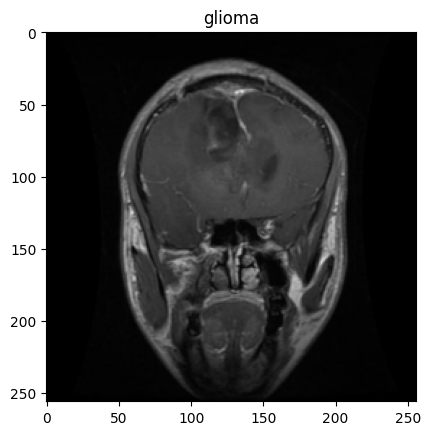

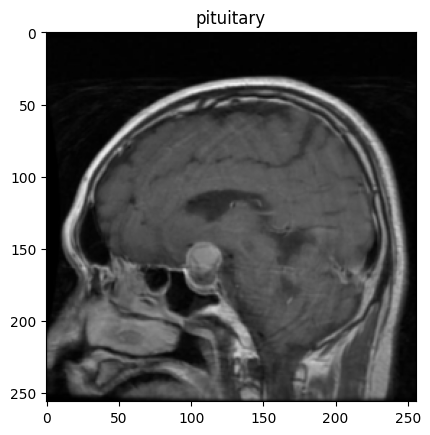

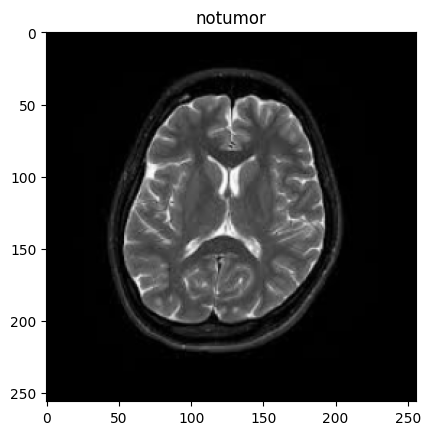

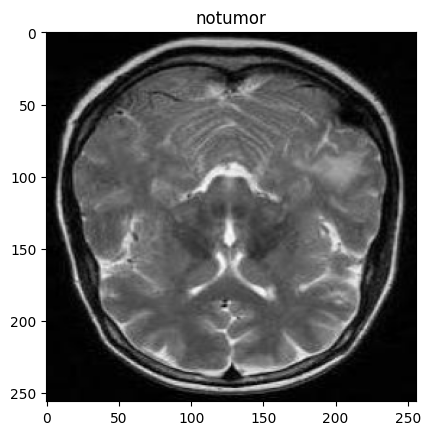

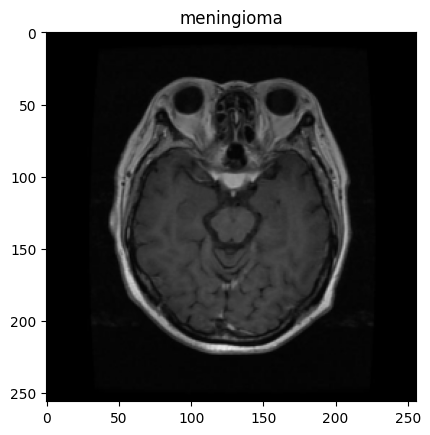

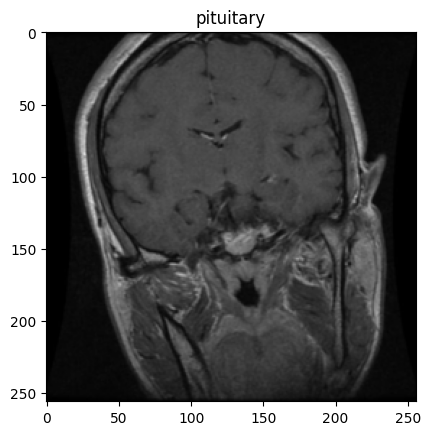

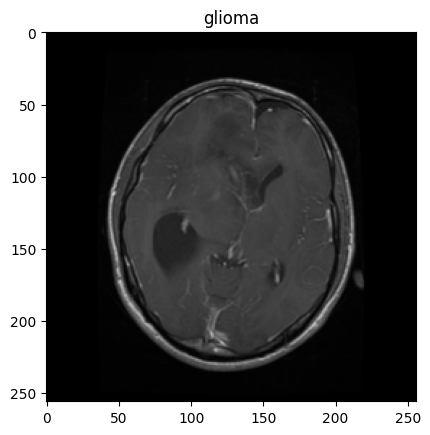

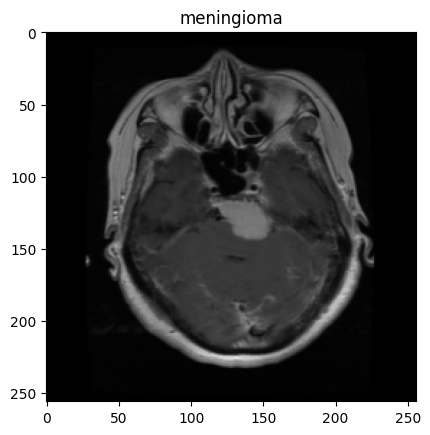

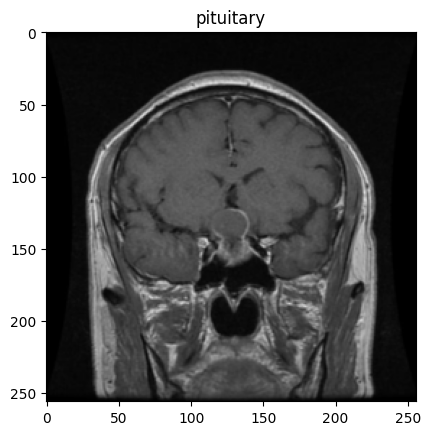

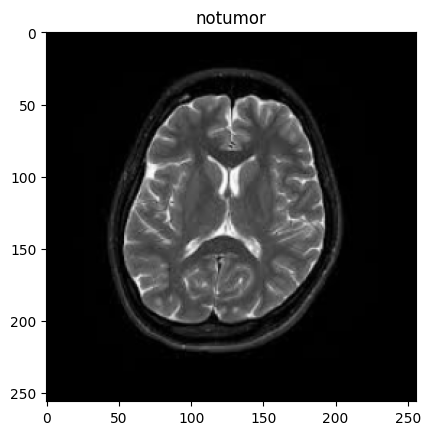

In [6]:
import numpy as np
import matplotlib.pyplot as plt

images , labels = next(iter(train_dataloader))
random_indexes = list(np.random.randint(0,len(images),10))
for i in random_indexes:
    plt.figure()
    plt.subplot(1,1,1)
    plt.imshow(images[i].permute(1,2,0))
    plt.title(class_names[labels[i]])

In [7]:
## lets encode our data to use that easier

In [8]:
class AutoEncoder(nn.Module):
  def __init__(self):
    super().__init__()
    self.encoder = nn.Sequential(
        nn.Conv2d(3, 16, 3,stride=2, padding=1),
        nn.ReLU(),
        nn.Conv2d(16, 32,3, stride=2, padding=1),
        nn.ReLU(),
        nn.Conv2d(32, 64, 3, stride=2, padding=1),
        nn.ReLU(),
        nn.Conv2d(64,128,3, stride=2, padding=1),
        #nn.ReLU(),
        #nn.Conv2d(128,256,3, stride=2, padding=1)
    )
    self.decoder = nn.Sequential(
        #nn.ConvTranspose2d(256, 128,3,stride=2,padding=1, output_padding=1),
        #nn.ReLU(),
        nn.ConvTranspose2d(128, 64,3,stride=2,padding=1, output_padding=1),
        nn.ReLU(),
        nn.ConvTranspose2d(64, 32,3,stride=2,padding=1, output_padding=1),
        nn.ReLU(),
        nn.ConvTranspose2d(32, 16,3,stride=2,padding=1, output_padding=1),
        nn.ReLU(),
        nn.ConvTranspose2d(16, 3,3,stride=2,padding=1, output_padding=1),
        nn.Sigmoid()
    )
  def forward(self,x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded
model = AutoEncoder().to(device)

In [9]:
from tqdm import tqdm
epochs = 10
optimizer = torch.optim.Adam(lr=0.001,params=model.parameters())
loss_fn = nn.MSELoss()

for epoch in tqdm(range(epochs)):
  for batch,(X,y) in enumerate(train_dataloader):
    X,y=X.to(device),y.to(device)

    output = model(X)
    loss = loss_fn(output,X)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
  print(f"Epoch_{epoch}  Loss:{loss}")



 10%|█         | 1/10 [00:29<04:26, 29.56s/it]

Epoch_0  Loss:0.009609324857592583


 20%|██        | 2/10 [00:54<03:35, 26.88s/it]

Epoch_1  Loss:0.004415835253894329


 30%|███       | 3/10 [01:19<03:01, 25.90s/it]

Epoch_2  Loss:0.004862302914261818


 40%|████      | 4/10 [01:43<02:31, 25.29s/it]

Epoch_3  Loss:0.004107018932700157


 50%|█████     | 5/10 [02:08<02:05, 25.02s/it]

Epoch_4  Loss:0.0022306654136627913


 60%|██████    | 6/10 [02:32<01:38, 24.74s/it]

Epoch_5  Loss:0.00200579222291708


 70%|███████   | 7/10 [02:57<01:14, 24.97s/it]

Epoch_6  Loss:0.00187267258297652


 80%|████████  | 8/10 [03:22<00:49, 24.75s/it]

Epoch_7  Loss:0.0025092042051255703


 90%|█████████ | 9/10 [03:46<00:24, 24.51s/it]

Epoch_8  Loss:0.0011345529928803444


100%|██████████| 10/10 [04:10<00:00, 25.05s/it]

Epoch_9  Loss:0.0015662538353353739


786432


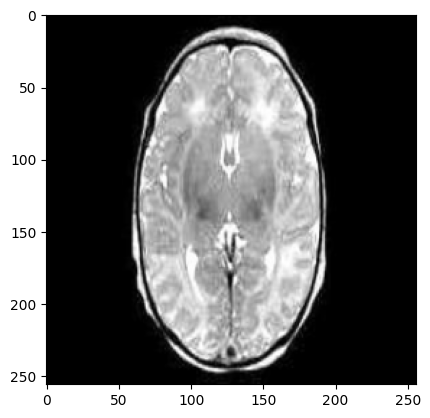

In [10]:
plt.imshow(images[0].permute(1,2,0))
print(images[0].element_size() *images[0].nelement())

131072

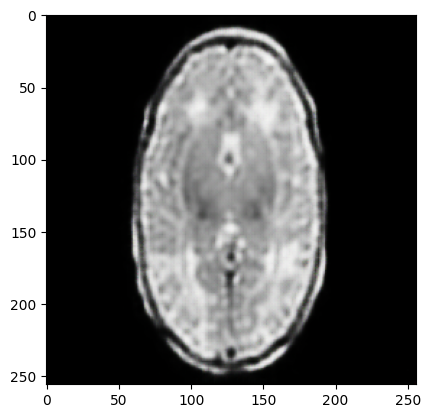

In [11]:
 plt.imshow(model(images[0].to(device)).cpu().detach().permute(1,2,0))
 encoded = model.encoder(images[0].to(device))
 encoded.element_size() *encoded.nelement()

## Encode train_dataloader

In [12]:
from torch.utils.data import TensorDataset
latent_list = []
label_list = []
model.encoder.eval()
with torch.no_grad():
  for images,labels in train_dataloader:
    images = images.to(device)
    laten = model.encoder(images)
    latent_list.append(laten.cpu()) # Move to CPU before appending
    label_list.append(labels.cpu()) # Move to CPU before appending
train_latent_data = torch.cat(latent_list) # Remove .cpu() here
train_labels_data = torch.cat(label_list) # Remove .cpu() here

train_encoded_dataset = TensorDataset(train_latent_data,train_labels_data)
train_encoded_dataloader = DataLoader(train_encoded_dataset,batch_size=32,shuffle=True,num_workers=os.cpu_count())

## Encode test_dataloader

In [13]:
from torch.utils.data import TensorDataset
latent_list = []
label_list = []
model.encoder.eval()
with torch.no_grad():
  for images,labels in test_dataloader:
    images = images.to(device)
    laten = model.encoder(images)
    latent_list.append(laten.cpu()) # Move to CPU before appending
    label_list.append(labels.cpu()) # Move to CPU before appending
test_latent_data = torch.cat(latent_list) # Remove .cpu() here
test_labels_data = torch.cat(label_list) # Remove .cpu() here

test_encoded_dataset = TensorDataset(test_latent_data,test_labels_data)
test_encoded_dataloader = DataLoader(test_encoded_dataset,batch_size=32,shuffle=True,num_workers=os.cpu_count())

In [14]:
train_encoded_dataloader.dataset.tensors[0].shape

torch.Size([5712, 128, 16, 16])

## Ok let's make our model and train it

In [108]:
class CNN(nn.Module):
  def __init__(self,hidden_units,input_shape,output_shape):
    super().__init__()
    self.conv_block_1=nn.Sequential(
        nn.Conv2d(in_channels=input_shape,out_channels=hidden_units,kernel_size=3,stride=1,padding=0),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,out_channels=hidden_units,kernel_size=3,stride=1,padding=0),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2,stride=2)#default stride size is same as kernelsize
    )
    self.conv_block_2=nn.Sequential(
        nn.Conv2d(in_channels=hidden_units,out_channels=hidden_units,kernel_size=3,stride=1,padding=0),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,out_channels=hidden_units,kernel_size=3,stride=1,padding=0),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2,stride=2)#default stride size is same as kernelsize
    )

    with torch.no_grad():
            dummy = torch.zeros(1,input_shape, 16, 16)  # shape like your data
            dummy_out = self.conv_block_2(self.conv_block_1(dummy))
            flatten_dim = dummy_out.view(1, -1).shape[1]

    self.classifier=nn.Sequential(
        nn.Flatten(),
        nn.Dropout(),
        nn.Linear(in_features=flatten_dim,
                  out_features=output_shape)
    )


  def forward(self,x):
      x=self.conv_block_1(x)
      #print(x.shape)
      x=self.conv_block_2(x)
      #print(x.shape)
      x=self.classifier(x)
      #print(x.shape)
      return x
cnn_model = CNN(10,128,len(class_names)) .to(device)

In [109]:
encoded_images,encoded_labels = next(iter(train_encoded_dataloader))

In [110]:
cnn_model(encoded_images.to(device)).shape

torch.Size([32, 4])

In [111]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(lr=0.01,params=cnn_model.parameters())


In [112]:
def train_step(model:nn.Module,
              dataloader:torch.utils.data.dataloader,
              loss_fn:nn.Module,
              optimizer:torch.optim.Optimizer,
              accuracy_fn):
    model.train()
    train_loss,train_acc=0,0
    for batch,(X,y) in enumerate(dataloader):
        X,y=X.to(device),y.to(device)

        y_pred=model(X)
        loss=loss_fn(y_pred,y)
        train_acc+=accuracy_fn(y,y_pred.argmax(dim=1))
        train_loss+=loss.item()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    train_acc/=len(dataloader)
    train_loss/=len(dataloader)
    return train_loss,train_acc

In [113]:
def test_step(model:nn.Module,
              dataloader:torch.utils.data.dataloader,
              loss_fn:nn.Module,
              accuracy_fn):
    model.eval()

    with torch.inference_mode():

        test_loss,test_acc=0,0
        for batch,(X,y) in enumerate(dataloader):
            X,y=X.to(device),y.to(device)

            y_pred=model(X)

            loss=loss_fn(y_pred,y)

            test_loss+=loss.item()
            test_acc+=accuracy_fn(y,y_pred.argmax(dim=1))

        test_loss/=len(dataloader)
        test_acc/=len(dataloader)
        return test_loss,test_acc

In [120]:
!pip install tensorboard
from tqdm.auto import tqdm
from timeit import default_timer as timer
from torch.utils.tensorboard import SummaryWriter
def train(model:nn.Module,
         train_dataloader:torch.utils.data.dataloader,
         test_dataloader:torch.utils.data.dataloader,
         loss_fn,
         accuracy_fn,
         optimizer:torch.optim.Optimizer,
         epochs:int,
         writer:SummaryWriter=None):
    start=timer()
    results={
        "train_loss":[],
        "train_acc":[],
        "test_loss":[],
        "test_acc":[]
    }
    for epoch in tqdm(range(epochs)):
        train_loss,train_acc=train_step(model=model,
                                        dataloader=train_dataloader,
                                        loss_fn=loss_fn,
                                        optimizer=optimizer,
                                        accuracy_fn=accuracy_fn)
        test_loss,test_acc=test_step(model=model,
                                     dataloader=test_dataloader,
                                     loss_fn=loss_fn,
                                     accuracy_fn=accuracy_fn)
        if writer:
          writer.add_scalars(main_tag="Loss",
                               tag_scalar_dict={"train_loss": train_loss,
                                                "test_loss": test_loss},
                               global_step=epoch)
          writer.add_scalars(main_tag="Accuracy",
                               tag_scalar_dict={"train_acc": train_acc,
                                                "test_acc": test_acc},
                               global_step=epoch)


          writer.close()
        print(f"Epochs :{epoch} | Train loss :{train_loss:.4} | Train accuracy :{train_acc:.3} | Test loss :{test_loss:.4} | Test accuracy :{test_acc:.3} " )

        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)
    end=timer()
    print(end-start)
    return results


In [115]:
def accuracy_fn(y_true, y_pred):
  """Calculates accuracy between target and prediction tensors.

  Args:
      y_true (torch.Tensor): Truth labels.
      y_pred (torch.Tensor): Predicted labels.

  Returns:
      [type]: Accuracy as a percentage.
  """
  correct = torch.eq(y_true, y_pred).sum().item()
  acc = (correct / len(y_pred)) * 100
  return acc

In [124]:
from datetime import datetime
def create_writer(model_name:str,expriment_name:str,extra:str=None):
  time_stamp = datetime.now().strftime('%Y-%m-%d  %H:%M')
  log_dir=""

  if extra:
      log_dir=os.path.join("runs",time_stamp,expriment_name,model_name,extra)
  else:
      log_dir=os.path.join("runs",time_stamp,expriment_name,model_name)

  return SummaryWriter(log_dir)

In [125]:
writer = create_writer('CNN_Encoded','MRI','20_epochs')
results = train(cnn_model,train_encoded_dataloader,test_encoded_dataloader,loss_fn,accuracy_fn,optimizer,20,writer)

  0%|          | 0/20 [00:00<?, ?it/s]

Epochs :0 | Train loss :0.721 | Train accuracy :69.8 | Test loss :0.6339 | Test accuracy :73.5 
Epochs :1 | Train loss :0.7084 | Train accuracy :70.0 | Test loss :0.6663 | Test accuracy :74.3 
Epochs :2 | Train loss :0.6912 | Train accuracy :70.5 | Test loss :0.6583 | Test accuracy :73.7 
Epochs :3 | Train loss :0.6946 | Train accuracy :70.5 | Test loss :0.646 | Test accuracy :74.6 
Epochs :4 | Train loss :0.6835 | Train accuracy :70.5 | Test loss :0.6038 | Test accuracy :74.1 
Epochs :5 | Train loss :0.669 | Train accuracy :71.8 | Test loss :0.5891 | Test accuracy :76.2 
Epochs :6 | Train loss :0.675 | Train accuracy :71.8 | Test loss :0.5891 | Test accuracy :75.3 
Epochs :7 | Train loss :0.6703 | Train accuracy :72.0 | Test loss :0.5685 | Test accuracy :77.7 
Epochs :8 | Train loss :0.649 | Train accuracy :72.6 | Test loss :0.5579 | Test accuracy :77.6 
Epochs :9 | Train loss :0.6522 | Train accuracy :72.0 | Test loss :0.6011 | Test accuracy :76.0 
Epochs :10 | Train loss :0.6548 | T

<IPython.core.display.Javascript object>

## What if we don't encode our dataset ?

In [131]:
class CNN(nn.Module):
  def __init__(self,hidden_units,input_shape,output_shape):
    super().__init__()
    self.conv_block_1=nn.Sequential(
        nn.Conv2d(in_channels=input_shape,out_channels=hidden_units,kernel_size=3,stride=1,padding=0),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,out_channels=hidden_units,kernel_size=3,stride=1,padding=0),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2,stride=2)#default stride size is same as kernelsize
    )
    self.conv_block_2=nn.Sequential(
        nn.Conv2d(in_channels=hidden_units,out_channels=hidden_units,kernel_size=3,stride=1,padding=0),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,out_channels=hidden_units,kernel_size=3,stride=1,padding=0),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2,stride=2)#default stride size is same as kernelsize
    )

    with torch.no_grad():
            dummy = torch.zeros(1,input_shape, 256, 256)  # shape like your data
            dummy_out = self.conv_block_2(self.conv_block_1(dummy))
            flatten_dim = dummy_out.view(1, -1).shape[1]

    self.classifier=nn.Sequential(
        nn.Flatten(),
        nn.Dropout(),
        nn.Linear(in_features=flatten_dim,
                  out_features=output_shape)
    )


  def forward(self,x):
      x=self.conv_block_1(x)
      #print(x.shape)
      x=self.conv_block_2(x)
      #print(x.shape)
      x=self.classifier(x)
      #print(x.shape)
      return x
cnn_model = CNN(10,3,len(class_names)) .to(device)

In [132]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(lr=0.01,params=cnn_model.parameters())

In [133]:
writer = create_writer('CNN','MRI','10_epochs')
results = train(cnn_model,train_dataloader,test_dataloader,loss_fn,accuracy_fn,optimizer,10,writer)

  0%|          | 0/10 [00:00<?, ?it/s]

Epochs :0 | Train loss :1.319 | Train accuracy :34.4 | Test loss :1.14 | Test accuracy :46.6 
Epochs :1 | Train loss :0.8408 | Train accuracy :67.0 | Test loss :0.8612 | Test accuracy :67.4 
Epochs :2 | Train loss :0.6785 | Train accuracy :74.8 | Test loss :0.8232 | Test accuracy :72.2 
Epochs :3 | Train loss :0.5825 | Train accuracy :78.2 | Test loss :0.6988 | Test accuracy :75.5 
Epochs :4 | Train loss :0.5298 | Train accuracy :80.7 | Test loss :0.8656 | Test accuracy :61.3 
Epochs :5 | Train loss :0.5041 | Train accuracy :81.2 | Test loss :0.5647 | Test accuracy :77.0 
Epochs :6 | Train loss :0.4696 | Train accuracy :83.6 | Test loss :0.6 | Test accuracy :76.4 
Epochs :7 | Train loss :0.4356 | Train accuracy :84.4 | Test loss :0.5369 | Test accuracy :80.4 
Epochs :8 | Train loss :0.4019 | Train accuracy :85.3 | Test loss :0.482 | Test accuracy :80.5 
Epochs :9 | Train loss :0.3649 | Train accuracy :87.0 | Test loss :0.3908 | Test accuracy :86.7 
305.7038720519995


##yes using dataset wait out encoding give us 15% more accuracy but training that take 10 times slower then encoded dataset

actualy using encoder on MRI dataset is not good i just want to test that to see what happend

In [134]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

'meningioma'

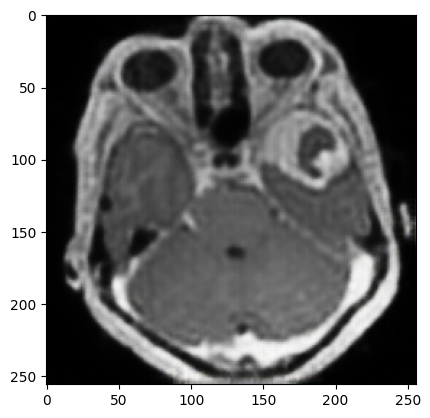

In [152]:
images,label = next(iter(test_encoded_dataloader))
img = model.decoder(images.to(device))

plt.imshow(img[0].detach().cpu().permute(1,2,0))
class_names[label[0]]